# Simple Regression Notebook

### DISCLAIMER:

<strong>This Notebook is part of a Capstone Project. The analysis, preprocessing steps, as well as scaling, encoding and transformation, and other data pipeline steps are intentially left out to demonstrate the difference between simplistic regression models and more advanced regression models which are included in other notebooks within this repository. This notebook intentionally does not adhere to best practices.</strong>

### Import Libraries

In [1]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [2]:
def plot_results():
    error_list = [abs(i-j) for i,j in zip(Y_test,y_test_pred)]
    result_df = pd.DataFrame(zip(Y_test,y_test_pred,error_list),columns=(["Ground Truth","Prediction","Absolute Error"]))
    result_df = result_df[(result_df["Ground Truth"] > 0) & (result_df["Ground Truth"] < 150)]
    
    fig = px.scatter(result_df,x="Ground Truth", y="Prediction",width=1500, height=600,
                     labels=dict(x="Ground Truth", y="Prediction"), color="Absolute Error")


    fig.update_xaxes(title_font=dict(size=35, color='black'))
    fig.update_yaxes(title_font=dict(size=35, color='black'))
    fig.update_xaxes(zeroline=False)
    fig.update_yaxes(zeroline=False)

    fig.update_xaxes(range=[0, 100])
    fig.update_yaxes(range=[0, 120])

    title="Regression Prediction Results compared to Ground Truth"

    fig.show()

In [3]:
df = pd.read_csv("uber_preprocessed.csv")
df.drop("Unnamed: 0",inplace=True,axis=1)

In [4]:
df.head()

,fare_amount,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,year,month,day,hour,minute,second,date,time,day_of_week,distance
0,7.5,-73.999817,40.738354,-73.999512,40.723217,1,2015,5,7,19,52,6,2015-05-07,19:52:06,3,1.683851
1,7.7,-73.994355,40.728225,-73.994710,40.750325,1,2009,7,17,20,4,56,2009-07-17,20:04:56,4,2.458361
2,12.9,-74.005043,40.740770,-73.962565,40.772647,1,2009,8,24,21,45,0,2009-08-24,21:45:00,0,5.037958
3,5.3,-73.976124,40.790844,-73.965316,40.803349,3,2009,6,26,8,22,21,2009-06-26,08:22:21,4,1.662205
4,16.0,-73.925023,40.744085,-73.973082,40.761247,5,2014,8,28,17,47,0,2014-08-28,17:47:00,3,4.476855


In [5]:
# Drop Columns that are not relevant for prediction
df.drop(["date","time","minute","second"],axis=1,inplace=True)

In [6]:
target = "fare_amount"
features = [col for col in df.columns.tolist() if col != "fare_amount"]

X = df[features]
Y = df[target]

In [7]:
X_train, X_test, Y_train, Y_test = train_test_split(X,Y,test_size=0.33, random_state=42)

In [8]:
#Create Linear Regression Object
LR = LinearRegression()

In [9]:
model = LR.fit(X_train, Y_train)

In [10]:
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

In [11]:
# Error DataFrame
error_df = []
error_df.append(pd.Series({'train': mean_squared_error(Y_train, y_train_pred),
                           'test' : mean_squared_error(Y_test,  y_test_pred)},
                           name='Simple Regression'))

In [12]:
pd.DataFrame(error_df)

,train,test
Simple Regression,23.147037,26.794121


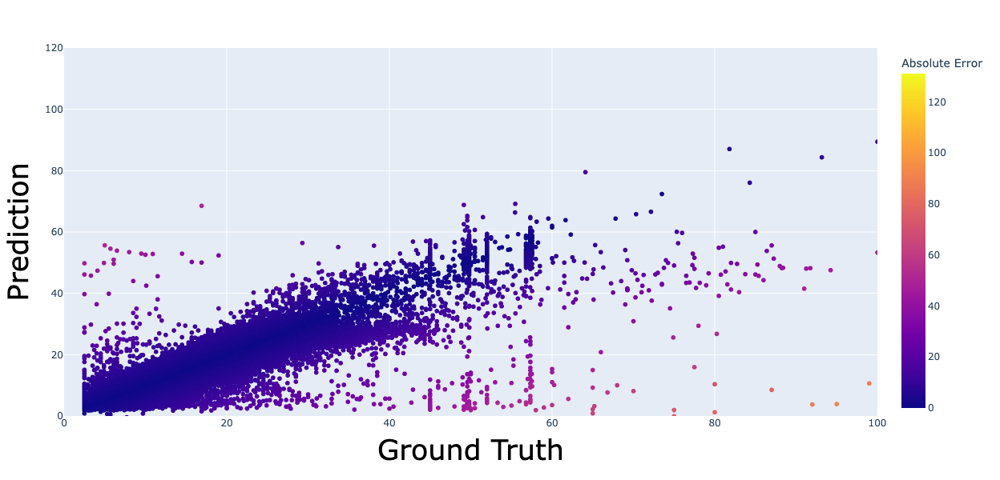

In [13]:
plot_results()